<div><div style="text-align:left;display:inline-block;float:left"><code>Eduardo Cardenas</code></div> <div style="text-align:right;display:inline-block;float:right"><code>Computación Científica - UNMSM</code></div></div>
<hr width=100% align=center>
<h1 style="text-align:center">Método Implícito - Ecuación del Calor</h1>

Vamos aplicar este método a la ecuación del calor

$$
\begin{cases}
 \dfrac{\partial u}{\partial t} = c^2 \dfrac{\partial^2 u}{\partial x^2} & \text{para } (x,t) \in (a,b)\times(0,T)\\ 
 {\scriptsize\mbox{ tal que}} & \\ 
 u(x,0) = f(x) & \text{para } x\in(a,b)    \\
 u(a,t) = 0 = u(b,t)  & \text{para } t\in(0,T)
\end{cases} 
$$

Denotamos la siguiente partición:
$$h = \frac{b-a}{m}, \qquad k = \frac{T}{n} \quad \mbox{tal que} \quad x_{i+1} = x_i + h, \qquad t_{j+1} = t_j + k $$

Utilizamos la siguiente notación :
$$ w_{i,j} = u(x_i,t_j) $$

### Formulas para aproximar las derivadas parciales
Este método se caracteriza por utilizar las siguientes formulas:

$$\frac{\partial u}{\partial t} \simeq \frac{ w_{i,j} - w_{i,j-1} }{ k }$$

$$\frac{\partial^2 u}{\partial x^2} \simeq \frac{ w_{i+1,j} - 2w_{i,j} + w_{i-1,j}}{h^2} $$

## Ahora encontremos la fórmula para Método Implícito
Conocidas las aproximaciones de las derivadas parciales , reemplazemos sus aproximaciones en la ecuación del calor y luego procederemos a encontrar una formula que nos permita aproximar $w_{i,j}$

$$ \frac{ w_{i,j} - w_{i,j-1} }{ k } = c^2\frac{ w_{i+1,j} - 2w_{i,j} + w_{i-1,j}}{h^2}$$
sea $\lambda = \dfrac{c^2 k}{h^2}$
$$ w_{i,j} - w_{i,j-1} = \lambda w_{i+1,j} - 2\lambda w_{i,j} + \lambda w_{i-1,j}$$

$$ w_{i,j-1} = -\lambda w_{i-1, j} + (1 + 2\lambda)w_{i, j} -\lambda w_{i+1, j}$$

expresamos esta formula matricialmente :

$$
\left( \begin{array}{c}
        w_{1,j-1}  \\
        w_{2,j-1}  \\
        w_{3,j-1}  \\
        \vdots   \\
        w_{m-1,j-1}\\
       \end{array}
\right)  = \left( \begin{array}{ccccc}
        1+2\lambda & -\lambda    & 0          & \cdots  & 0          \\
        -\lambda    & 1+2\lambda & -\lambda    & \cdots  & 0          \\
        0          & -\lambda    & 1+2\lambda & \cdots  & 0          \\
        \vdots     & \vdots     & \vdots     & \ddots  & -\lambda   \\
        0          & 0          & 0          & -\lambda & 1+2\lambda \\        
        \end{array}
\right) \left( \begin{array}{c}
       w_{1,j}  \\
       w_{2,j}  \\
       w_{3,j}  \\
       \vdots     \\
       w_{m-1,j}\\
       \end{array}
\right)       
$$

$$w^{(j-1)} = Aw^{(j)}$$

<p>
<span id="eq02" style="float:right;">(1)</span>
$$w^{( j )} = A^{-1}w^{(j-1)}$$
</p>

Usamos la ecuación <a style="text-decoration:none;" href="#eq01">(1)</a> para hallar una solución aproximada de $u(x,t)$.

## Código Python 

Utilizando la ecuación <a style="text-decoration:none;" href="#eq01">(1)</a> :

In [3]:
import numpy as np

def tridiag(a,b,c,N):
    A = np.zeros((N,N))
    
    np.fill_diagonal(A[:-1,1:],a)
    np.fill_diagonal(A,b)
    np.fill_diagonal(A[1:,:-1],c)
    
    return A


def metodoImplicito(c, L, T, h, k, f, a, b):
    
    r = c*k/h**2
    m = round(L/h) + 1
    n = round(T/k) + 1
    
    x = np.linspace(0, L, m)
    
    sol = np.zeros((n,m))
    sol[0] = f(x)
    sol[:,0] = a(0) 
    sol[:,-1] = b(L)
    
    A = tridiag(-r, 1+2*r, -r, m-2) 

    A_inv = np.linalg.inv(A)
    
    for i in range(n-1):
        C = sol[i,1:-1].copy() 
        C[0] += r*sol[i,0]
        C[-1] += r*sol[i,-1]
        sol[i+1,1:-1] = np.dot(A_inv, C)
        
    return sol

### Ejercicio

Resolver el siguiente problema :

<p>
$$
\begin{align*}    
\begin{cases}
 \dfrac{\partial u}{\partial t} = 0.9 \dfrac{\partial^2 u}{\partial x^2} & \text{para } (x,t) \in [0,1]\times\langle0,T]\\ 
 {\scriptsize\mbox{ tal que}} & \\ 
 u(x,0) = \sin(\pi x) & \text{para } x\in[0,1]    \\
 u(0,t) = 0 = u(1,t)  & \text{para } t\in\langle0,T]
\end{cases} 
\end{align*}
$$
</p>

Usar el tiempo $T = 0.3$ seg, con $h = 0.1$ m, $k = 0.1$ seg. Usar el método explícito. ¿ Es buena la aproximación ?. La solución a este problema es $u(x,t) = e^{-0.9\pi^2t}\sin(\pi x)$

### Solución

Utilizamos el método implícito para aproximar la solución :

In [17]:
sol_aprox = metodoImplicito(0.9, 1, 0.4, 0.1, 0.001, lambda x: np.sin(np.pi*x), lambda x: 0, lambda x: 0)

Ahora comparamos la solución exacta con la aproximada para $t=0.4$ seg.

Hallamos la solución exacta

In [18]:
x = np.linspace(0,1,11)

t = 0.4

sol_exac = np.exp(-0.9*(np.pi**2)*t)*np.sin(np.pi*x)

creamos una función para comparar el valor aproximado con el exacto

In [19]:
import pandas as pd

def comparar(x, sol_aprox, sol_exac):
    
    error = abs(sol_exac - sol_aprox)

    error_por = abs(np.divide(error, sol_exac, 
                          out = np.zeros_like(error), 
                          where = np.round(sol_exac,6) != 0.0)*100)

    data = {"posición":x,
            "sol. exacta": np.round(sol_exac, 6),
            "sol. aprox.": np.round(sol_aprox, 6),
            "error": np.round(error, 6),
            "error %": np.round(error_por,2)}

    tabla = pd.DataFrame(data)
    tabla = tabla[["posición", "sol. exacta", "sol. aprox.", "error", "error %"] ]
    return tabla

utilizamos la función creada para comparar la solución exacta y aproximada

In [20]:
comparar(x, sol_aprox[-1], sol_exac)

,posición,sol. exacta,sol. aprox.,error,error %
0,0.0,0.000000,0.000000,0.000000,0.00
1,0.1,0.008849,0.009253,0.000403,4.56
2,0.2,0.016832,0.017599,0.000767,4.56
3,0.3,0.023168,0.024223,0.001056,4.56
4,0.4,0.027235,0.028476,0.001241,4.56
5,0.5,0.028637,0.029942,0.001305,4.56
6,0.6,0.027235,0.028476,0.001241,4.56
7,0.7,0.023168,0.024223,0.001056,4.56
8,0.8,0.016832,0.017599,0.000767,4.56
9,0.9,0.008849,0.009253,0.000403,4.56


Podemos obsevar que tenemos un error porcentual de  $4\%$  para el valor de la temperatura aproximada en  t=0.4 seg.

**Grafica de la solución aproximada**

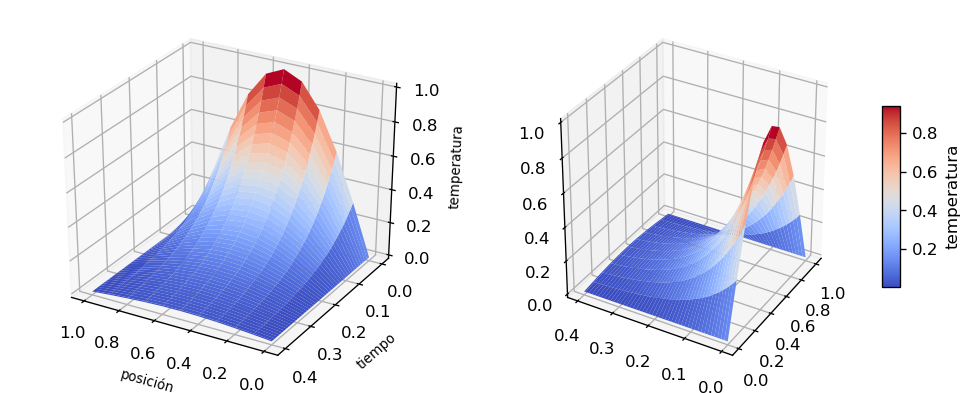

In [21]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

x = np.linspace(0, 1, 11)
t = np.linspace(0, 0.4, 401)
x,t = np.meshgrid(x,t)

fig = plt.figure(figsize=(10.0,4.0), dpi=120)
ax01 = fig.add_subplot(121, projection="3d")
ax02 = fig.add_subplot(122, projection="3d")

surf01 = ax01.plot_surface(x, t, sol_aprox, cmap = cm.coolwarm)
ax01.view_init(30, 120)
ax01.set_xlabel("posición", fontsize=8)
ax01.set_ylabel("tiempo", fontsize=8)
ax01.set_zlabel("temperatura", fontsize=8)

surf02 = ax02.plot_surface(x, t, sol_aprox, cmap = cm.coolwarm)
ax02.view_init(30, 210)

fig.colorbar(surf01, shrink=0.5, aspect=10, label="temperatura")

plt.show()

**Comportamiento de la temperatura al transcurrir del tiempo**

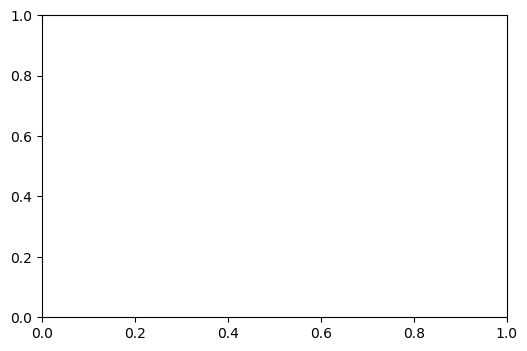

In [24]:
import matplotlib.animation as animation
from matplotlib import rc
from IPython.display import HTML 

rc('animation', html='jshtml')

fig = plt.figure(figsize=(6.0,4.0), dpi=100)
ax = fig.add_subplot(111)

x = np.linspace(0,1,11)
t = np.linspace(0,0.4,401)

In [26]:
def init():
    ax.plot([], [])
    ax.set_ylim(0, 1.5)
    ax.grid()
    ax.set_ylabel("Temperatura")
    ax.set_xlabel("Posición en la barra")
    ax.set_title("Variación de la temperatura en una barra")

def animate(i):
    del ax.lines[:]
    ax.plot(x, sol_aprox[i], color="blue", label="aprox. $t = {0:.2f}$ seg.".format(t[i]))
    ax.legend()
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(sol_aprox), interval=60, repeat=True)

anim